In [15]:
import os
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torchvision import datasets, models
from torch.utils.data import DataLoader
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [4]:
data_dir = './data/hymenoptera_data'

In [5]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}


In [6]:
# Datasets
image_datasets = {
    x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x])
    for x in ['train', 'val']
}

# Dataloaders
dataloaders = {
    x: DataLoader(image_datasets[x], batch_size=32, shuffle=True, num_workers=4)
    for x in ['train', 'val']
}

# Class names
class_names = image_datasets['train'].classes
num_classes = len(class_names)

In [7]:
#################################
# PART 1: Training Loop
#################################

from torch.optim import lr_scheduler
import time
import copy

def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_finetune=True):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        # Each epoch has train and val
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # Loop over data
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train' and scheduler is not None:
                scheduler.step()

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Save best model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

    time_elapsed = time.time() - since
    print(f'\nTraining complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    model.load_state_dict(best_model_wts)
    return model


In [8]:
#################################
# PART 1: Finetuning All Layers
#################################

model_ft = models.resnet18(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, num_classes)
model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_ft = torch.optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

model_ft = train_model(model_ft, dataloaders, criterion, optimizer_ft, exp_lr_scheduler, num_epochs=25)


/home/aj3246/TRITON/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/aj3246/TRITON/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Epoch 1/25
----------
train Loss: 0.7169 Acc: 0.5410
val Loss: 0.5686 Acc: 0.7386

Epoch 2/25
----------
train Loss: 0.4266 Acc: 0.8115
val Loss: 0.3470 Acc: 0.8758

Epoch 3/25
----------
train Loss: 0.2599 Acc: 0.9303
val Loss: 0.2832 Acc: 0.8954

Epoch 4/25
----------
train Loss: 0.1905 Acc: 0.9590
val Loss: 0.2521 Acc: 0.9150

Epoch 5/25
----------
train Loss: 0.1304 Acc: 0.9672
val Loss: 0.2212 Acc: 0.9346

Epoch 6/25
----------
train Loss: 0.0789 Acc: 0.9918
val Loss: 0.2205 Acc: 0.9216

Epoch 7/25
----------
train Loss: 0.0644 Acc: 1.0000
val Loss: 0.2049 Acc: 0.9412

Epoch 8/25
----------
train Loss: 0.0757 Acc: 0.9877
val Loss: 0.2089 Acc: 0.9412

Epoch 9/25
----------
train Loss: 0.0470 Acc: 0.9959
val Loss: 0.2090 Acc: 0.9412

Epoch 10/25
----------
train Loss: 0.0700 Acc: 0.9918
val Loss: 0.2113 Acc: 0.9346

Epoch 11/25
----------
train Loss: 0.0521 Acc: 1.0000
val Loss: 0.2120 Acc: 0.9346

Epoch 12/25
----------
train Loss: 0.0570 Acc: 0.9959
val Loss: 0.2094 Acc: 0.9346



In [9]:
#################################
# PART 1: Feature Extractor Mode
#################################

model_conv = models.resnet18(pretrained=True)
for param in model_conv.parameters():
    param.requires_grad = False

num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, num_classes)
model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_conv = torch.optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

model_conv = train_model(model_conv, dataloaders, criterion, optimizer_conv, exp_lr_scheduler, num_epochs=25, is_finetune=False)



Epoch 1/25
----------
train Loss: 0.7113 Acc: 0.5738
val Loss: 0.5527 Acc: 0.7320

Epoch 2/25
----------
train Loss: 0.5714 Acc: 0.7131
val Loss: 0.4198 Acc: 0.8431

Epoch 3/25
----------
train Loss: 0.4080 Acc: 0.8279
val Loss: 0.3681 Acc: 0.8889

Epoch 4/25
----------
train Loss: 0.3344 Acc: 0.8770
val Loss: 0.3065 Acc: 0.8889

Epoch 5/25
----------
train Loss: 0.2923 Acc: 0.8811
val Loss: 0.3238 Acc: 0.8954

Epoch 6/25
----------
train Loss: 0.2216 Acc: 0.9262
val Loss: 0.2627 Acc: 0.8889

Epoch 7/25
----------
train Loss: 0.2053 Acc: 0.9549
val Loss: 0.2742 Acc: 0.9085

Epoch 8/25
----------
train Loss: 0.1741 Acc: 0.9508
val Loss: 0.2737 Acc: 0.9085

Epoch 9/25
----------
train Loss: 0.1730 Acc: 0.9590
val Loss: 0.2750 Acc: 0.9085

Epoch 10/25
----------
train Loss: 0.1733 Acc: 0.9549
val Loss: 0.2630 Acc: 0.9150

Epoch 11/25
----------
train Loss: 0.1695 Acc: 0.9672
val Loss: 0.2555 Acc: 0.8954

Epoch 12/25
----------
train Loss: 0.1988 Acc: 0.9303
val Loss: 0.2537 Acc: 0.9020



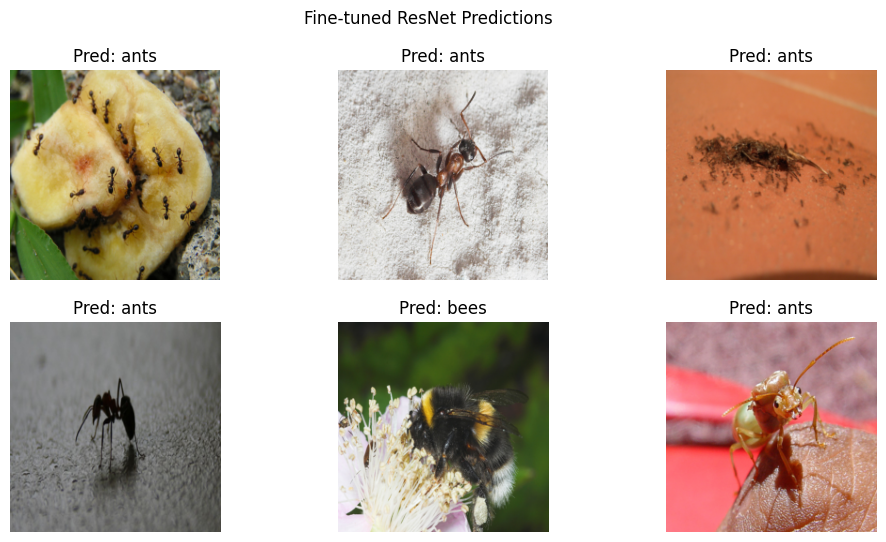

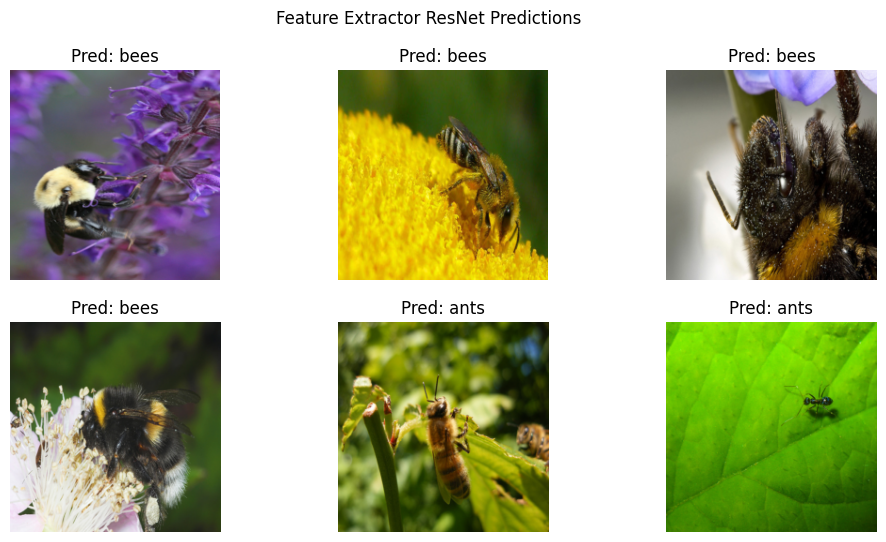

In [10]:
#################################
# PART 1: Evaluation
#################################

import matplotlib.pyplot as plt
import numpy as np

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title:
        plt.title(title)
    plt.axis('off')

def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0

    plt.figure(figsize=(12, 6))

    with torch.no_grad():
        for inputs, labels in dataloaders['val']:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                plt.subplot(2, num_images//2, images_so_far)
                imshow(inputs.cpu().data[j], title=f'Pred: {class_names[preds[j]]}')
                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

# Visualize predictions (optional)
visualize_model(model_ft)
plt.suptitle("Fine-tuned ResNet Predictions")

visualize_model(model_conv)
plt.suptitle("Feature Extractor ResNet Predictions")
plt.show()



[INFO] Evaluating model: Fine-tuned ResNet18


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 12.81it/s]



📄 Classification Report:
              precision    recall  f1-score   support

        ants       0.92      0.96      0.94        70
        bees       0.96      0.93      0.94        83

    accuracy                           0.94       153
   macro avg       0.94      0.94      0.94       153
weighted avg       0.94      0.94      0.94       153



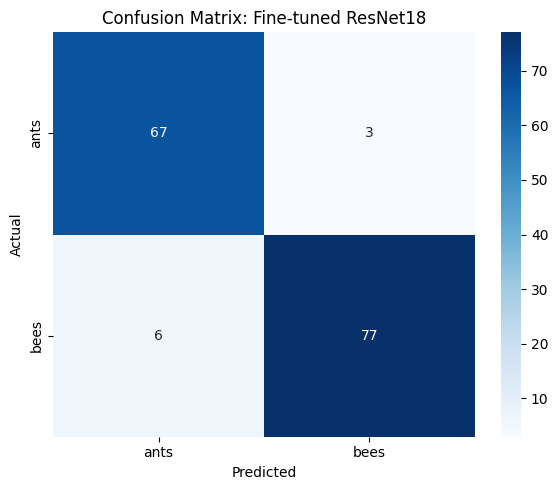


[INFO] Evaluating model: Feature Extractor ResNet18


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 12.45it/s]



📄 Classification Report:
              precision    recall  f1-score   support

        ants       0.86      0.97      0.91        70
        bees       0.97      0.87      0.92        83

    accuracy                           0.92       153
   macro avg       0.92      0.92      0.91       153
weighted avg       0.92      0.92      0.92       153



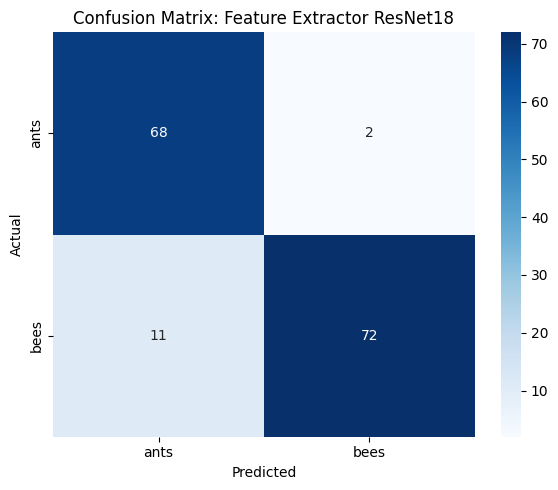

In [16]:
def evaluate_model(model, dataloader, class_names, title="Model Evaluation"):
    print(f"\n[INFO] Evaluating model: {title}")
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in tqdm(dataloader, desc="Evaluating"):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Metrics
    print("\n📄 Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix: {title}")
    plt.tight_layout()
    plt.show()


# Evaluate fine-tuned model
evaluate_model(model_ft, dataloaders['val'], class_names, title="Fine-tuned ResNet18")

# Evaluate feature extractor model
evaluate_model(model_conv, dataloaders['val'], class_names, title="Feature Extractor ResNet18")


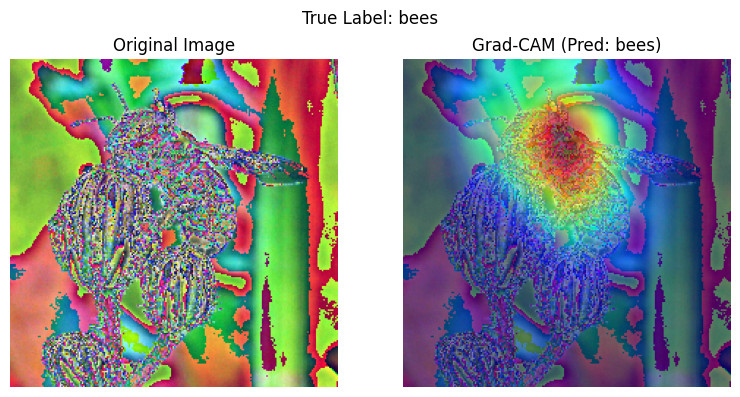

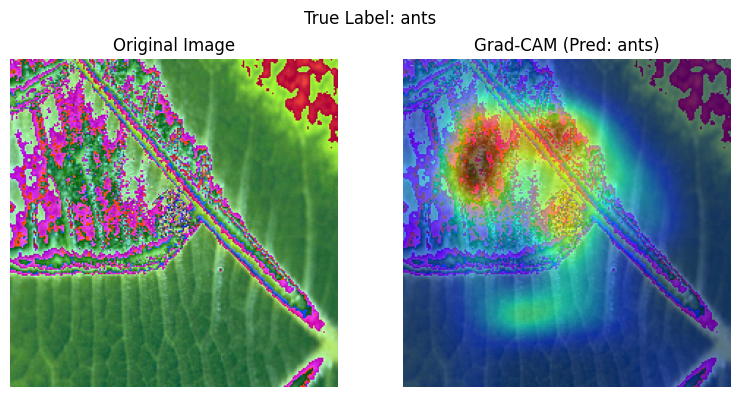

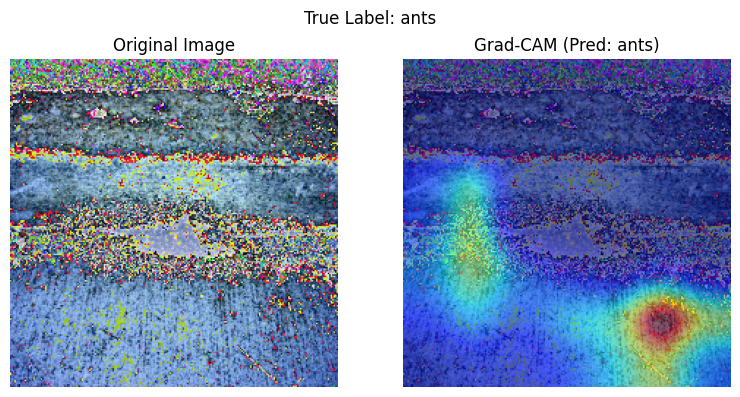

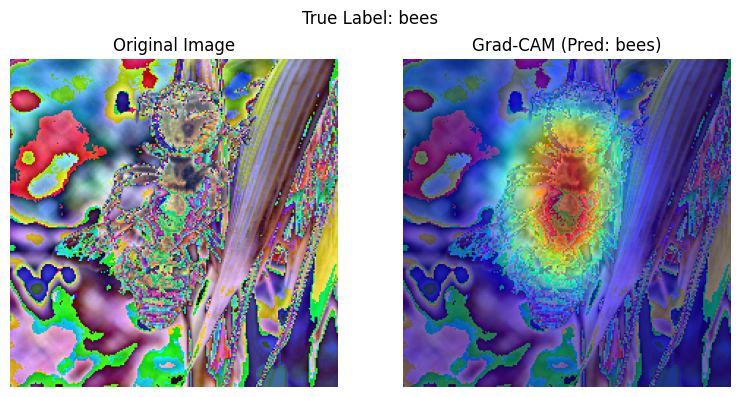

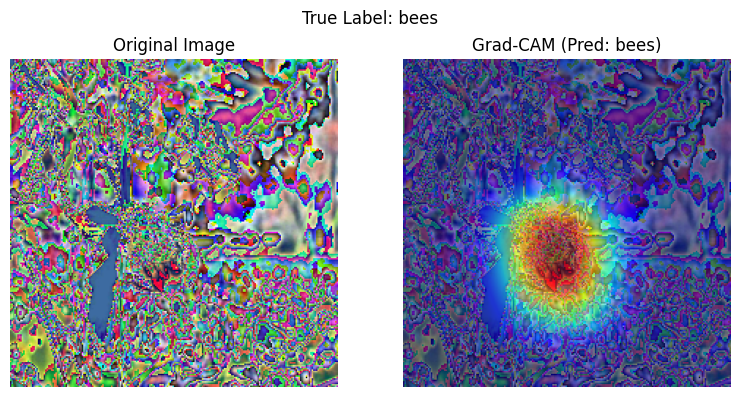

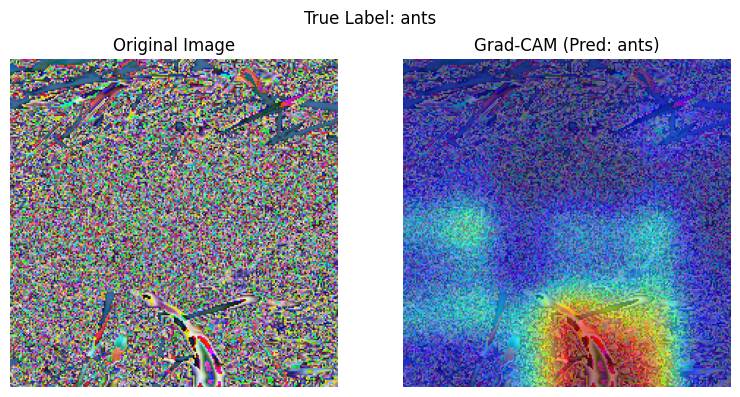

In [52]:
#################################
# PART 1: Grad-CAM Visualization
#################################
from torchcam.methods import GradCAM
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid


cam_extractor = GradCAM(model_ft, target_layer="layer4")

def show_gradcam_samples(model, dataloader, class_names, num_per_class=3):
    model.eval()
    cam_extractor = GradCAM(model, target_layer="layer4")

    shown_per_class = {cls: 0 for cls in range(len(class_names))}
    max_total = num_per_class * len(class_names)

    for inputs, labels in dataloader:
        inputs, labels = inputs.to(device), labels.to(device)

        for i in range(inputs.size(0)):
            label = labels[i].item()
            if shown_per_class[label] >= num_per_class:
                continue

            input_img = inputs[i].unsqueeze(0).to(device).requires_grad_()
            outputs = model(input_img)
            pred_class = outputs.argmax(1).item()

            cam = cam_extractor(pred_class, outputs)
            cam_img = cam[0].detach().cpu()

            if cam_img.ndim == 3 and cam_img.shape[0] > 1:
                cam_img = cam_img.mean(dim=0, keepdim=True)

            # Prepare images
            orig_img = to_pil_image(inputs[i].cpu())
            cam_overlay = overlay_mask(orig_img, to_pil_image(cam_img.squeeze(0), mode='F'), alpha=0.5)

            # Plot side-by-side
            fig, axs = plt.subplots(1, 2, figsize=(8, 4))
            axs[0].imshow(orig_img)
            axs[0].set_title("Original Image")
            axs[1].imshow(cam_overlay)
            axs[1].set_title(f"Grad-CAM (Pred: {class_names[pred_class]})")

            for ax in axs:
                ax.axis('off')
            plt.suptitle(f"True Label: {class_names[label]}")
            plt.tight_layout()
            plt.show()

            shown_per_class[label] += 1
            if sum(shown_per_class.values()) >= max_total:
                return

# Show 5 Grad-CAM visualizations from val set
show_gradcam_samples(model_ft, dataloaders['val'], class_names)

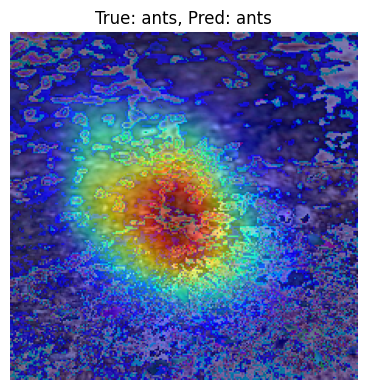

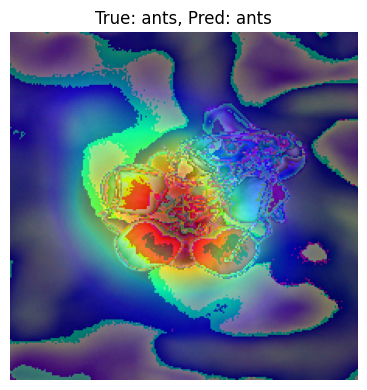

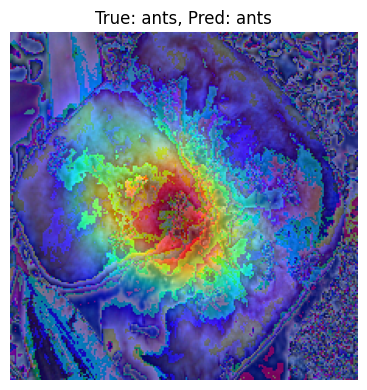

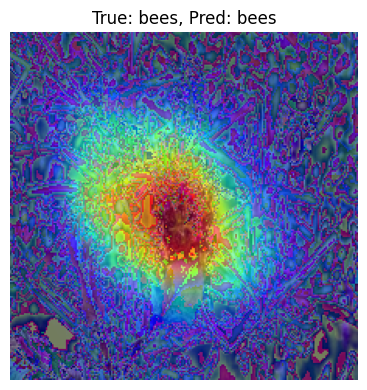

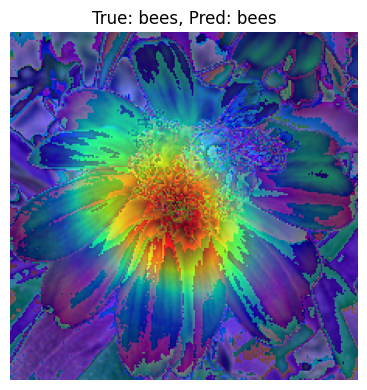

In [44]:
show_gradcam_samples(model_conv, dataloaders['val'], class_names, num_images=5)

In [31]:
#################################
# PART 2: Diffusion Sampling
#################################

from diffusers import DDIMPipeline
import torch
from PIL import Image
import os


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


# Set save path
save_path = './data/cats_real_fake/fake_cats'
os.makedirs(save_path, exist_ok=True)

# Load pipeline 
# Load the pipeline (NO use_safetensors)

pipe = DDIMPipeline.from_pretrained("google/ddpm-cat-256").to(device)
pipe.to(device)

# Generate 150 fake images
for i in range(150):
    image = pipe(num_inference_steps=25).images[0]
    image.save(os.path.join(save_path, f"fake_cat_{i}.png"))
    print(f"✅ Saved fake_cat_{i}.png")


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Using device: cuda


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]An error occurred while trying to fetch /home/aj3246/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9: Error no file named diffusion_pytorch_model.safetensors found in directory /home/aj3246/.cache/huggingface/hub/models--google--ddpm-cat-256/snapshots/82ca0d5db4a5ec6ff0e9be8d86852490bc18a3d9.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
100%|██████████| 25/25 [00:01<00:00, 21.16it/s]


✅ Saved fake_cat_0.png


100%|██████████| 25/25 [00:01<00:00, 22.01it/s]


✅ Saved fake_cat_1.png


100%|██████████| 25/25 [00:01<00:00, 21.11it/s]


✅ Saved fake_cat_2.png


100%|██████████| 25/25 [00:01<00:00, 21.02it/s]


✅ Saved fake_cat_3.png


100%|██████████| 25/25 [00:01<00:00, 22.03it/s]


✅ Saved fake_cat_4.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_5.png


100%|██████████| 25/25 [00:01<00:00, 21.06it/s]


✅ Saved fake_cat_6.png


100%|██████████| 25/25 [00:01<00:00, 21.21it/s]


✅ Saved fake_cat_7.png


100%|██████████| 25/25 [00:01<00:00, 21.04it/s]


✅ Saved fake_cat_8.png


100%|██████████| 25/25 [00:01<00:00, 21.81it/s]


✅ Saved fake_cat_9.png


100%|██████████| 25/25 [00:01<00:00, 21.19it/s]


✅ Saved fake_cat_10.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_11.png


100%|██████████| 25/25 [00:01<00:00, 21.98it/s]


✅ Saved fake_cat_12.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_13.png


100%|██████████| 25/25 [00:01<00:00, 21.05it/s]


✅ Saved fake_cat_14.png


100%|██████████| 25/25 [00:01<00:00, 21.92it/s]


✅ Saved fake_cat_15.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_16.png


100%|██████████| 25/25 [00:01<00:00, 21.06it/s]


✅ Saved fake_cat_17.png


100%|██████████| 25/25 [00:01<00:00, 21.99it/s]


✅ Saved fake_cat_18.png


100%|██████████| 25/25 [00:01<00:00, 21.12it/s]


✅ Saved fake_cat_19.png


100%|██████████| 25/25 [00:01<00:00, 21.06it/s]


✅ Saved fake_cat_20.png


100%|██████████| 25/25 [00:01<00:00, 21.27it/s]


✅ Saved fake_cat_21.png


100%|██████████| 25/25 [00:01<00:00, 21.12it/s]


✅ Saved fake_cat_22.png


100%|██████████| 25/25 [00:01<00:00, 21.77it/s]


✅ Saved fake_cat_23.png


100%|██████████| 25/25 [00:01<00:00, 21.19it/s]


✅ Saved fake_cat_24.png


100%|██████████| 25/25 [00:01<00:00, 21.16it/s]


✅ Saved fake_cat_25.png


100%|██████████| 25/25 [00:01<00:00, 22.21it/s]


✅ Saved fake_cat_26.png


100%|██████████| 25/25 [00:01<00:00, 21.05it/s]


✅ Saved fake_cat_27.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_28.png


100%|██████████| 25/25 [00:01<00:00, 21.98it/s]


✅ Saved fake_cat_29.png


100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


✅ Saved fake_cat_30.png


100%|██████████| 25/25 [00:01<00:00, 21.07it/s]


✅ Saved fake_cat_31.png


100%|██████████| 25/25 [00:01<00:00, 21.96it/s]


✅ Saved fake_cat_32.png


100%|██████████| 25/25 [00:01<00:00, 21.15it/s]


✅ Saved fake_cat_33.png


100%|██████████| 25/25 [00:01<00:00, 21.06it/s]


✅ Saved fake_cat_34.png


100%|██████████| 25/25 [00:01<00:00, 21.25it/s]


✅ Saved fake_cat_35.png


100%|██████████| 25/25 [00:01<00:00, 21.15it/s]


✅ Saved fake_cat_36.png


100%|██████████| 25/25 [00:01<00:00, 21.75it/s]


✅ Saved fake_cat_37.png


100%|██████████| 25/25 [00:01<00:00, 21.25it/s]


✅ Saved fake_cat_38.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_39.png


100%|██████████| 25/25 [00:01<00:00, 21.96it/s]


✅ Saved fake_cat_40.png


100%|██████████| 25/25 [00:01<00:00, 21.03it/s]


✅ Saved fake_cat_41.png


100%|██████████| 25/25 [00:01<00:00, 21.19it/s]


✅ Saved fake_cat_42.png


100%|██████████| 25/25 [00:01<00:00, 21.88it/s]


✅ Saved fake_cat_43.png


100%|██████████| 25/25 [00:01<00:00, 21.15it/s]


✅ Saved fake_cat_44.png


100%|██████████| 25/25 [00:01<00:00, 21.05it/s]


✅ Saved fake_cat_45.png


100%|██████████| 25/25 [00:01<00:00, 21.91it/s]


✅ Saved fake_cat_46.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_47.png


100%|██████████| 25/25 [00:01<00:00, 21.17it/s]


✅ Saved fake_cat_48.png


100%|██████████| 25/25 [00:01<00:00, 21.19it/s]


✅ Saved fake_cat_49.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_50.png


100%|██████████| 25/25 [00:01<00:00, 21.96it/s]


✅ Saved fake_cat_51.png


100%|██████████| 25/25 [00:01<00:00, 21.27it/s]


✅ Saved fake_cat_52.png


100%|██████████| 25/25 [00:01<00:00, 21.16it/s]


✅ Saved fake_cat_53.png


100%|██████████| 25/25 [00:01<00:00, 21.82it/s]


✅ Saved fake_cat_54.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_55.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_56.png


100%|██████████| 25/25 [00:01<00:00, 21.79it/s]


✅ Saved fake_cat_57.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_58.png


100%|██████████| 25/25 [00:01<00:00, 21.11it/s]


✅ Saved fake_cat_59.png


100%|██████████| 25/25 [00:01<00:00, 21.86it/s]


✅ Saved fake_cat_60.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_61.png


100%|██████████| 25/25 [00:01<00:00, 21.10it/s]


✅ Saved fake_cat_62.png


100%|██████████| 25/25 [00:01<00:00, 21.26it/s]


✅ Saved fake_cat_63.png


100%|██████████| 25/25 [00:01<00:00, 21.15it/s]


✅ Saved fake_cat_64.png


100%|██████████| 25/25 [00:01<00:00, 21.89it/s]


✅ Saved fake_cat_65.png


100%|██████████| 25/25 [00:01<00:00, 21.20it/s]


✅ Saved fake_cat_66.png


100%|██████████| 25/25 [00:01<00:00, 21.11it/s]


✅ Saved fake_cat_67.png


100%|██████████| 25/25 [00:01<00:00, 21.97it/s]


✅ Saved fake_cat_68.png


100%|██████████| 25/25 [00:01<00:00, 21.10it/s]


✅ Saved fake_cat_69.png


100%|██████████| 25/25 [00:01<00:00, 21.12it/s]


✅ Saved fake_cat_70.png


100%|██████████| 25/25 [00:01<00:00, 22.03it/s]


✅ Saved fake_cat_71.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_72.png


100%|██████████| 25/25 [00:01<00:00, 21.05it/s]


✅ Saved fake_cat_73.png


100%|██████████| 25/25 [00:01<00:00, 21.79it/s]


✅ Saved fake_cat_74.png


100%|██████████| 25/25 [00:01<00:00, 21.18it/s]


✅ Saved fake_cat_75.png


100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


✅ Saved fake_cat_76.png


100%|██████████| 25/25 [00:01<00:00, 21.28it/s]


✅ Saved fake_cat_77.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_78.png


100%|██████████| 25/25 [00:01<00:00, 21.75it/s]


✅ Saved fake_cat_79.png


100%|██████████| 25/25 [00:01<00:00, 21.23it/s]


✅ Saved fake_cat_80.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_81.png


100%|██████████| 25/25 [00:01<00:00, 21.88it/s]


✅ Saved fake_cat_82.png


100%|██████████| 25/25 [00:01<00:00, 21.06it/s]


✅ Saved fake_cat_83.png


100%|██████████| 25/25 [00:01<00:00, 21.15it/s]


✅ Saved fake_cat_84.png


100%|██████████| 25/25 [00:01<00:00, 22.15it/s]


✅ Saved fake_cat_85.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_86.png


100%|██████████| 25/25 [00:01<00:00, 21.07it/s]


✅ Saved fake_cat_87.png


100%|██████████| 25/25 [00:01<00:00, 21.80it/s]


✅ Saved fake_cat_88.png


100%|██████████| 25/25 [00:01<00:00, 21.11it/s]


✅ Saved fake_cat_89.png


100%|██████████| 25/25 [00:01<00:00, 21.25it/s]


✅ Saved fake_cat_90.png


100%|██████████| 25/25 [00:01<00:00, 21.24it/s]


✅ Saved fake_cat_91.png


100%|██████████| 25/25 [00:01<00:00, 21.16it/s]


✅ Saved fake_cat_92.png


100%|██████████| 25/25 [00:01<00:00, 21.82it/s]


✅ Saved fake_cat_93.png


100%|██████████| 25/25 [00:01<00:00, 21.27it/s]


✅ Saved fake_cat_94.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_95.png


100%|██████████| 25/25 [00:01<00:00, 21.83it/s]


✅ Saved fake_cat_96.png


100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


✅ Saved fake_cat_97.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_98.png


100%|██████████| 25/25 [00:01<00:00, 21.98it/s]


✅ Saved fake_cat_99.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_100.png


100%|██████████| 25/25 [00:01<00:00, 21.12it/s]


✅ Saved fake_cat_101.png


100%|██████████| 25/25 [00:01<00:00, 21.80it/s]


✅ Saved fake_cat_102.png


100%|██████████| 25/25 [00:01<00:00, 21.17it/s]


✅ Saved fake_cat_103.png


100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


✅ Saved fake_cat_104.png


100%|██████████| 25/25 [00:01<00:00, 21.29it/s]


✅ Saved fake_cat_105.png


100%|██████████| 25/25 [00:01<00:00, 21.17it/s]


✅ Saved fake_cat_106.png


100%|██████████| 25/25 [00:01<00:00, 21.71it/s]


✅ Saved fake_cat_107.png


100%|██████████| 25/25 [00:01<00:00, 21.24it/s]


✅ Saved fake_cat_108.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_109.png


100%|██████████| 25/25 [00:01<00:00, 22.08it/s]


✅ Saved fake_cat_110.png


100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


✅ Saved fake_cat_111.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_112.png


100%|██████████| 25/25 [00:01<00:00, 22.09it/s]


✅ Saved fake_cat_113.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_114.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_115.png


100%|██████████| 25/25 [00:01<00:00, 22.19it/s]


✅ Saved fake_cat_116.png


100%|██████████| 25/25 [00:01<00:00, 21.15it/s]


✅ Saved fake_cat_117.png


100%|██████████| 25/25 [00:01<00:00, 21.06it/s]


✅ Saved fake_cat_118.png


100%|██████████| 25/25 [00:01<00:00, 21.25it/s]


✅ Saved fake_cat_119.png


100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


✅ Saved fake_cat_120.png


100%|██████████| 25/25 [00:01<00:00, 21.84it/s]


✅ Saved fake_cat_121.png


100%|██████████| 25/25 [00:01<00:00, 21.19it/s]


✅ Saved fake_cat_122.png


100%|██████████| 25/25 [00:01<00:00, 21.12it/s]


✅ Saved fake_cat_123.png


100%|██████████| 25/25 [00:01<00:00, 21.98it/s]


✅ Saved fake_cat_124.png


100%|██████████| 25/25 [00:01<00:00, 21.05it/s]


✅ Saved fake_cat_125.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_126.png


100%|██████████| 25/25 [00:01<00:00, 21.90it/s]


✅ Saved fake_cat_127.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_128.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_129.png


100%|██████████| 25/25 [00:01<00:00, 21.88it/s]


✅ Saved fake_cat_130.png


100%|██████████| 25/25 [00:01<00:00, 21.12it/s]


✅ Saved fake_cat_131.png


100%|██████████| 25/25 [00:01<00:00, 21.27it/s]


✅ Saved fake_cat_132.png


100%|██████████| 25/25 [00:01<00:00, 21.28it/s]


✅ Saved fake_cat_133.png


100%|██████████| 25/25 [00:01<00:00, 21.13it/s]


✅ Saved fake_cat_134.png


100%|██████████| 25/25 [00:01<00:00, 21.91it/s]


✅ Saved fake_cat_135.png


100%|██████████| 25/25 [00:01<00:00, 21.20it/s]


✅ Saved fake_cat_136.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_137.png


100%|██████████| 25/25 [00:01<00:00, 22.10it/s]


✅ Saved fake_cat_138.png


100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


✅ Saved fake_cat_139.png


100%|██████████| 25/25 [00:01<00:00, 21.14it/s]


✅ Saved fake_cat_140.png


100%|██████████| 25/25 [00:01<00:00, 21.93it/s]


✅ Saved fake_cat_141.png


100%|██████████| 25/25 [00:01<00:00, 21.15it/s]


✅ Saved fake_cat_142.png


100%|██████████| 25/25 [00:01<00:00, 21.06it/s]


✅ Saved fake_cat_143.png


100%|██████████| 25/25 [00:01<00:00, 21.96it/s]


✅ Saved fake_cat_144.png


100%|██████████| 25/25 [00:01<00:00, 21.09it/s]


✅ Saved fake_cat_145.png


100%|██████████| 25/25 [00:01<00:00, 21.33it/s]


✅ Saved fake_cat_146.png


100%|██████████| 25/25 [00:01<00:00, 21.24it/s]


✅ Saved fake_cat_147.png


100%|██████████| 25/25 [00:01<00:00, 21.08it/s]


✅ Saved fake_cat_148.png


100%|██████████| 25/25 [00:01<00:00, 21.84it/s]


✅ Saved fake_cat_149.png


In [32]:
#################################
# PART 2: Moving 100 fake images for training and 50 for validation
#################################

import os
import shutil

# Paths
fake_src = './data/cats_real_fake/fake_cats'
fake_train_dst = './data/cats_real_fake/fake_cats/train/fake'
fake_val_dst = './data/cats_real_fake/fake_cats/val/fake'

# Create train/val folders
os.makedirs(fake_train_dst, exist_ok=True)
os.makedirs(fake_val_dst, exist_ok=True)

# Get all image files sorted by name
all_fake_images = sorted([
    f for f in os.listdir(fake_src)
    if f.lower().endswith(('.png', '.jpg', '.jpeg'))
])

# Move first 100 to train folder
for f in all_fake_images[:100]:
    shutil.move(os.path.join(fake_src, f), os.path.join(fake_train_dst, f))

# Move next 50 (not from the first 100) to val folder
for f in all_fake_images[100:150]:
    shutil.move(os.path.join(fake_src, f), os.path.join(fake_val_dst, f))

print("✅ Moved 100 fake images to train and next 50 to validation folders.")


✅ Moved 100 fake images to train and next 50 to validation folders.


In [35]:
import os

# Paths
fake_src = './data/cats_real_fake/fake_cats'
fake_train_dst = './data/cats_real_fake/fake_cats/train/fake'
fake_val_dst = './data/cats_real_fake/fake_cats/val/fake'

real_src = './data/cats_real_fake/real_cats'
real_train_dst = './data/cats_real_fake/real_cats/train/real'
real_val_dst = './data/cats_real_fake/real_cats/val/real'

def count_images(folder):
    return len([
        f for f in os.listdir(folder)
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ])

print("📊 Image Counts:")
print(f"🔹 Source folder     : {count_images(fake_src)} images")
print(f"🔹 Train/fake folder : {count_images(fake_train_dst)} images")
print(f"🔹 Val/fake folder   : {count_images(fake_val_dst)} images")


print("📊 Image Counts:")
print(f"🔹 Source folder     : {count_images(real_src)} images")
print(f"🔹 Train/real folder : {count_images(real_train_dst)} images")
print(f"🔹 Val/real folder   : {count_images(real_val_dst)} images")


📊 Image Counts:
🔹 Source folder     : 0 images
🔹 Train/fake folder : 100 images
🔹 Val/fake folder   : 50 images
📊 Image Counts:
🔹 Source folder     : 0 images
🔹 Train/real folder : 100 images
🔹 Val/real folder   : 50 images


In [36]:
import os
import shutil

# Source folders
fake_train_src = './data/cats_real_fake/fake_cats/train/fake'
fake_val_src = './data/cats_real_fake/fake_cats/val/fake'
real_train_src = './data/cats_real_fake/real_cats/train/real'
real_val_src = './data/cats_real_fake/real_cats/val/real'

# Target folders for training and validation (unified structure)
train_fake_dst = './data/cats_real_fake/train/fake'
train_real_dst = './data/cats_real_fake/train/real'
val_fake_dst = './data/cats_real_fake/val/fake'
val_real_dst = './data/cats_real_fake/val/real'

# Make target folders
os.makedirs(train_fake_dst, exist_ok=True)
os.makedirs(train_real_dst, exist_ok=True)
os.makedirs(val_fake_dst, exist_ok=True)
os.makedirs(val_real_dst, exist_ok=True)

# Helper to move files
def move_all(src, dst):
    for f in os.listdir(src):
        if f.lower().endswith(('.png', '.jpg', '.jpeg')):
            shutil.move(os.path.join(src, f), os.path.join(dst, f))

# Move images
move_all(fake_train_src, train_fake_dst)
move_all(fake_val_src, val_fake_dst)
move_all(real_train_src, train_real_dst)
move_all(real_val_src, val_real_dst)

print("✅ All images moved to unified train/val structure for ImageFolder.")


✅ All images moved to unified train/val structure for ImageFolder.


In [37]:
#################################
# PART 2: Fake-vs-Real Classifier
#################################

# Data transforms for classification
cat_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)  # since CIFAR-style images are less saturated
])

# Load dataset
data_dir = './data/cats_real_fake'

train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform=cat_transforms)
val_dataset = datasets.ImageFolder(os.path.join(data_dir, 'val'), transform=cat_transforms)

# Combine and split into train/val
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, pin_memory=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, pin_memory=True, num_workers=4)


# Define model
model_cat = models.resnet18(pretrained=True)
model_cat.fc = nn.Linear(model_cat.fc.in_features, 2)
model_cat = model_cat.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer_cat = torch.optim.Adam(model_cat.parameters(), lr=1e-4)

# Train loop
from tqdm import tqdm

def train_fake_vs_real(model, train_loader, val_loader, epochs=10):
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]", leave=False)

        for inputs, labels in train_bar:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer_cat.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer_cat.step()
            total_loss += loss.item()
            train_bar.set_postfix(loss=loss.item())

        print(f"📘 Epoch {epoch+1}: Avg Train Loss = {total_loss/len(train_loader):.4f}")

        # Validation
        model.eval()
        correct = 0
        total = 0
        val_bar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]  ", leave=False)
        with torch.no_grad():
            for inputs, labels in val_bar:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)
        print(f"✅ Epoch {epoch+1}: Validation Accuracy = {correct/total:.4f}")

# Optional: Faster DataLoader config


# Run training
train_fake_vs_real(model_cat, train_loader, val_loader)

/home/aj3246/TRITON/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/aj3246/TRITON/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


📘 Epoch 1: Avg Train Loss = 0.4447


✅ Epoch 1: Validation Accuracy = 0.8400


📘 Epoch 2: Avg Train Loss = 0.0446


✅ Epoch 2: Validation Accuracy = 0.9300


📘 Epoch 3: Avg Train Loss = 0.0271


✅ Epoch 3: Validation Accuracy = 0.9400


📘 Epoch 4: Avg Train Loss = 0.0086


✅ Epoch 4: Validation Accuracy = 0.9400


📘 Epoch 5: Avg Train Loss = 0.0159


✅ Epoch 5: Validation Accuracy = 0.9400


📘 Epoch 6: Avg Train Loss = 0.0063


✅ Epoch 6: Validation Accuracy = 0.9400


📘 Epoch 7: Avg Train Loss = 0.0085


✅ Epoch 7: Validation Accuracy = 0.9300


📘 Epoch 8: Avg Train Loss = 0.0057


✅ Epoch 8: Validation Accuracy = 0.9500


📘 Epoch 9: Avg Train Loss = 0.0044


✅ Epoch 9: Validation Accuracy = 0.9400


📘 Epoch 10: Avg Train Loss = 0.0054


✅ Epoch 10: Validation Accuracy = 0.9500


📊 Classification Report:
              precision    recall  f1-score   support

        real       0.96      0.94      0.95        50
        fake       0.94      0.96      0.95        50

    accuracy                           0.95       100
   macro avg       0.95      0.95      0.95       100
weighted avg       0.95      0.95      0.95       100



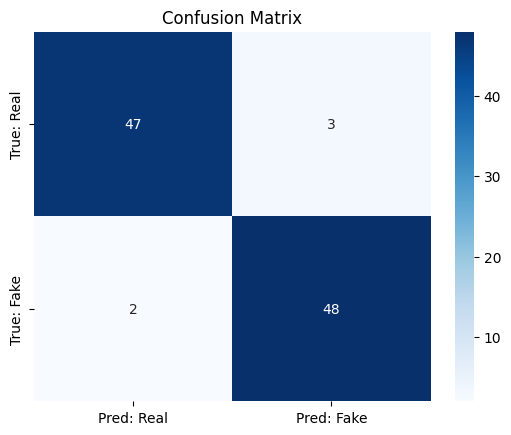

In [38]:
#################################
# PART 2: Evaluation Report
#################################

from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model(model, val_loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    print("📊 Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=['real', 'fake']))

    cm = confusion_matrix(all_labels, all_preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Pred: Real', 'Pred: Fake'],
                yticklabels=['True: Real', 'True: Fake'])
    plt.title("Confusion Matrix")
    plt.show()

# Call the evaluator
evaluate_model(model_cat, val_loader)


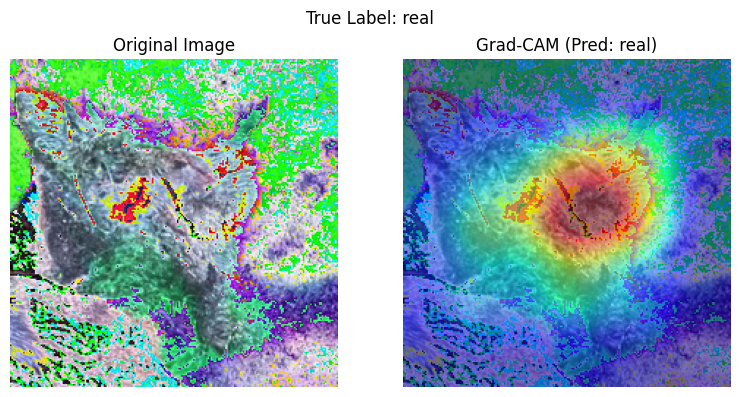

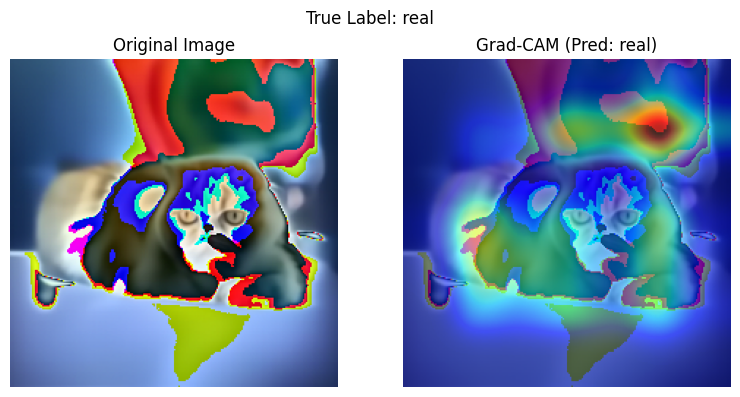

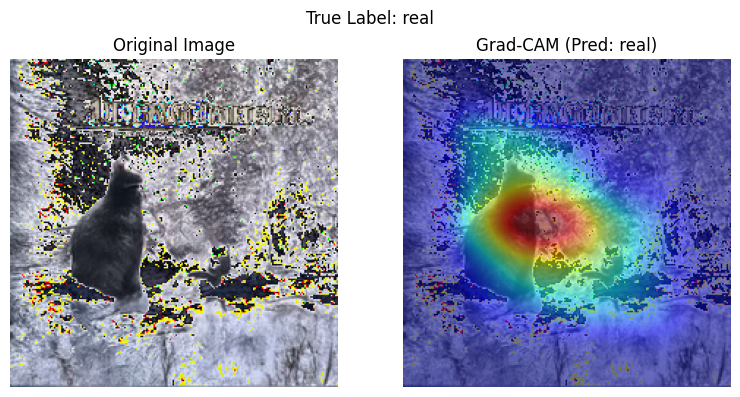

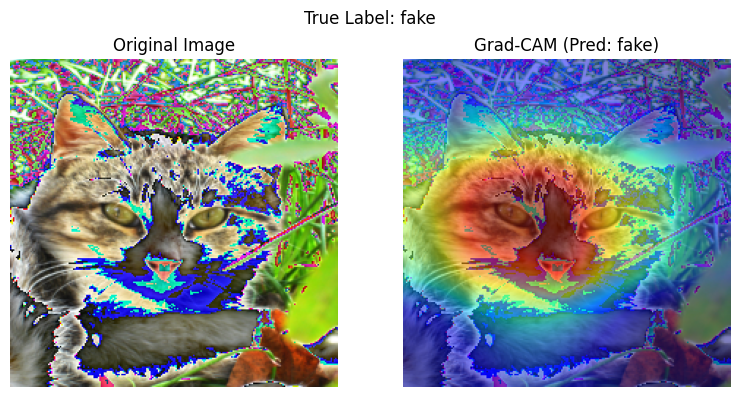

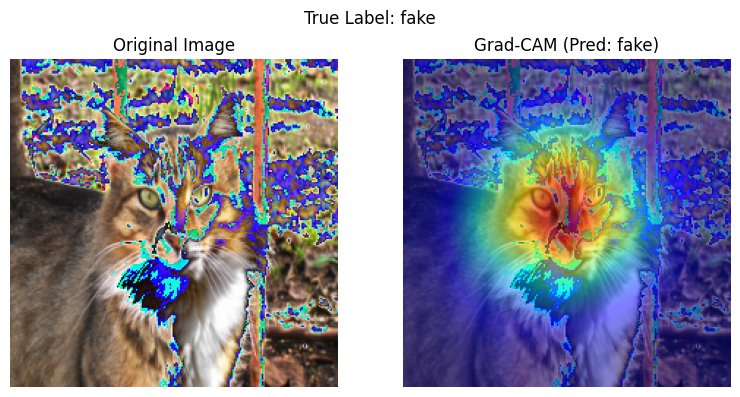

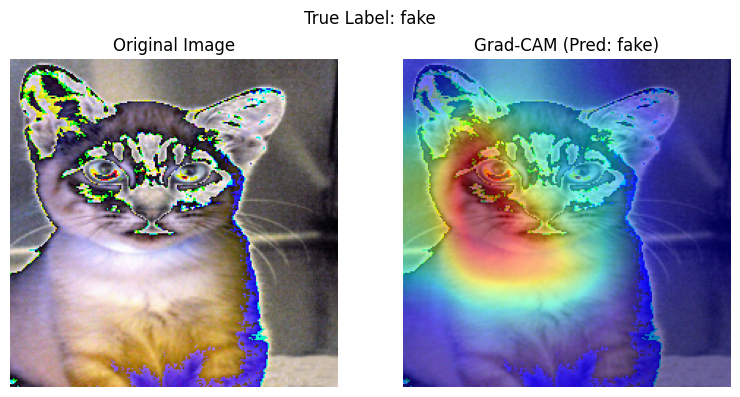

In [55]:
show_gradcam_samples(model_cat, val_loader, ['real', 'fake'])